# Imports + read adata

In [110]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad
#import celltypist

plt.rcParams['figure.figsize'] = (7, 7)
from scipy.stats import median_abs_deviation

In [112]:
xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad') # xie_leonie_pp_qc 

In [254]:
xie.obs

,annotation,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,leiden_0_5,manual_celltype_annotation,leiden_0_1,leiden_0_25,manual_celltype_annotation_coarse,leiden_res0_6,leiden_res0_75,leiden_res0_9,leiden_0_75,manual_celltype_annotation_0_75
AAACCTGAGGACATTA-1,Col13a1,1223,7.109879,2549,7.843849,26.794821,194,5.273000,7.610828,0,...,3,Myofibroblasts,0,0,Fibroblasts,1,1,0,1,Myofibroblasts
AAACCTGCAGTCGTGC-1,Myofibroblasts,1186,7.079184,2271,7.728416,23.029502,48,3.891820,2.113606,0,...,4,Peribronchial fibroblasts,5,5,Myofibroblast,4,3,3,3,Peribronchial fibroblasts
AAACCTGCATGAAGTA-1,Lipofibroblasts,885,6.786717,1642,7.404279,19.975639,22,3.135494,1.339829,0,...,11,Alveolar macrophages,3,3,Lipofibroblasts,13,13,8,13,Alveolar macrophages
AAACCTGTCTCGCATC-1,Myofibroblasts,680,6.523562,1196,7.087574,28.428094,15,2.772589,1.254181,0,...,4,Peribronchial fibroblasts,5,5,Myofibroblast,4,3,3,3,Peribronchial fibroblasts
AAACGGGTCCTAGAAC-1,Myofibroblasts,595,6.390241,944,6.851185,27.648305,21,3.091042,2.224576,0,...,4,Peribronchial fibroblasts,5,5,Myofibroblast,4,3,3,3,Peribronchial fibroblasts
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTACTGTCTGGCGAC-6,NaN,1123,7.024649,2548,7.843456,21.742543,61,4.127134,2.394035,0,...,5,B-cells,1,1,B-Cells,5,5,4,5,B-cells
TTTGCGCCAATGAAAC-6,NaN,1147,7.045777,2212,7.702104,16.455696,57,4.060443,2.576854,0,...,0,T-cells,2,2,T-Cells,7,11,7,11,T-cells
TTTGGTTCAGTAGAGC-6,NaN,1029,6.937314,2096,7.648263,15.410305,53,3.988984,2.528626,0,...,5,B-cells,1,1,B-Cells,5,5,4,5,B-cells
TTTGTCAAGCTACCGC-6,NaN,1021,6.929517,2039,7.620705,20.794507,77,4.356709,3.776361,0,...,5,B-cells,1,1,B-Cells,5,5,4,5,B-cells


In [194]:
xie.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [111]:
from matplotlib import colors
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,1))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Cell type annotation 

## Clustering using Leiden Algorithm

In [90]:
sc.tl.leiden(xie)

In [91]:
sc.tl.leiden(xie, key_added="leiden_res0_1", resolution=0.1)
sc.tl.leiden(xie, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(xie, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(xie, key_added="leiden_res1", resolution=1.0)

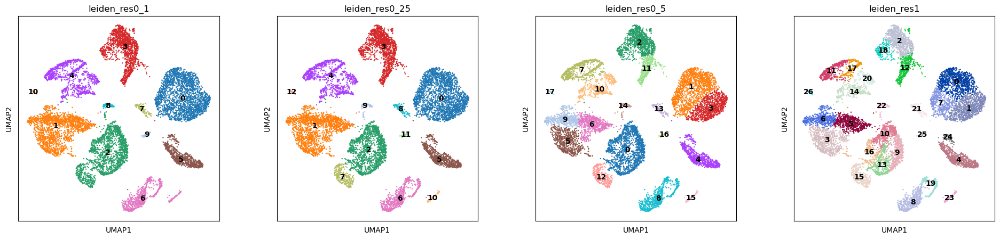

In [6]:
plt.rcParams['figure.figsize'] = (5, 5)
sc.pl.umap(
    xie,
    color=["leiden_res0_1","leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

--> first use resolution 0.25 for coarse overview, then 0.5 for finer annotation

In [99]:
# xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')
# xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## Defining marker genes

marker genes from Daniel's notebook

In [66]:
marker_genes = {
    'Macrophages':['Apoe', 'Mrc1', 'Marco', 'Mertk'], 
    'Monocytes': ['Cd14', 'Vcan'], 
    'T-Cells': ['Cd3e', 'Cd4','Cd8a', 'Cd3d'],
    'B-Cells':['Cd19', 'Cd79a', 'Ms4a1'],
    'AT2':['Muc1', 'Sftpc', 'Sftpd', 'Lcn2', "Cxcl15"],
    'AT1': ['Vegfa',"Ager", "Pdpn"], 
    'Krt8': ['Krt8'],
    'Endothelial': ['Pecam1', "Ly6c1"],
    'Fibroblasts': ['Col1a2'],
    "Myofibroblasts": ["Cthrc1", "Spp1", "Pdgfra", 
                       "Acta2", "Myh11", "Tagln", "Hhip"]    # xie paper uses also these
}

marker genes from HLCA 

In [67]:
marker_genes_hcla = {
    'Alveolar Macrophages':["Fabp4","Apoe","Msr1","Serping1","Mcemp1","Trem1","Gpnmb","Cyp27a1","Pparg","Nupr1"], 
    "Interstitial macrophages":["F13a1","Rnase1","Stab1","Rnase6","Gpr183","Fgl2","Csf1r","Fcgr2b","Il13ra1","Metrnl"],
    'Monocytes': ["Vcan","Cfp","Ereg","Cd300e","Fgl2"], # classical
    'T-Cells': ['Cd3e', 'Cd4','Cd8a', 'Cd3d'], # cd4 + cd 8
    'B-Cells':['Ms4a1',"Bank1","Ltb","Mef2c","Birc3","Limd2","Gpr183"], 
    'AT1': ["Ager","Cav1","Myl9","Sfta2", "Clic3", "Spock2", "Anxa3","Rtkn2", "Timp3", "Tnnc1"], # Ager    Cav1   Myl9        SFTA2        CliC3        Spock2        Anxa3        Rtkn2        Timp3        Tnnc1
    'AT2':['Sftpc', 'Sftpd', "Cxcl15", "Sfta2", "Lamp3", "Lrrk2", "Tfpi", "Mfsd2a"], # Sftpb        SFTPC        SFTPA1        SFTPA2        SFTA2        LAMP3        LRRK2        TFPI        MFSD2A        SERPINA1
   # 'Endothelial': ['Pecam1', "Ly6c1"], # from Daniel's 
   # 'Fibroblasts': ['Col1a2'], # from Daniel's 
    "Myofibroblasts": ["Aspn","Bche","Itgbl1","Myh11"],
    "NK-cells": ["Nkg7","Gzmb","Prf1","Cst7","Klrd1","Ctsw","Cd7","Gzma","Cd247"]
}

marker genes from xie paper

In [72]:
marker_genes_xie = {
    "Col13a1" : ["Col13a1"], 
    "Col14a1" : ["Col14a1"],
    'Fibroblasts' : ["Col1a1", "Pdgfra", "Vim", "Col4a1", "Fn1"], 
    "Lipofibroblasts":["Pparg", "Fabp1", "Fabp4", "Fabp5", "Lpl"], # not working:"Adrp"
    "Myofibroblasts": ["Acta2",  "Myh11","Tagln", "Hhip", "Aspn", "Mustn1"], 
    "Endothelial": ["Pecam1", "Cdh5", "Edn1", "Kdr", "Ets1", "Gata2"], 
    "Mesothelial": ["Wt1", "Upk3b", "Lrrn4", "Msln", "Calb2"], 
    "Pdgfrb-high":["Pdgfrb"] # only in fibrotic condition
}

## color umap by Daniel's marker genes

In [ ]:
for cell_type in marker_genes.keys():
    print(cell_type)
    sc.pl.umap(xie, color=marker_genes[cell_type], cmap=mymap, size=20)

In [ ]:
# todo cd4 und cd 8 t cells unterteilen
# sample abchecken 
# at1 und at2 zusammen  --> epithelia --> annotate higher level
# fibroblast subcluster, Alveolar fibroblasts, Adventitial fibroblasts
# check doublets in libofibroblast /macropages marker, check quatlity of cells, mitochondiral gene counts 
# check healthy not healthy state mixed or only one condition in one cluster 
# more dotplots 
# do dotplot with master dict of marker genes on every dataset, harmonize, 2 levels (name should be fixed) 

## color umap by HLCA marker genes

In [ ]:
for cell_type in marker_genes_hcla.keys():
    print(cell_type)
    sc.pl.umap(xie, color=marker_genes_hcla[cell_type], cmap=mymap, size=20)

## color UMAP by Xie markers

In [ ]:
for cell_type in marker_genes_xie.keys():
    print(cell_type)
    sc.pl.umap(xie, color=marker_genes_xie[cell_type], cmap=mymap, size=20)

## Leiden resolution=0.25 - coarse annotation

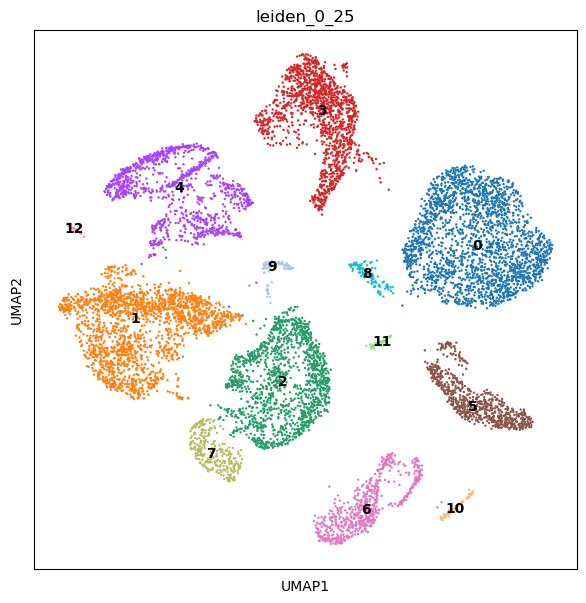

In [36]:
sc.tl.leiden(xie, resolution=0.25, key_added="leiden_0_25")
plt.rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(xie, color="leiden_0_25", legend_loc="on data")

In [80]:
cl_anno_coarse = { 
    "0": "Fibroblasts", 
    "1": "B-Cells", # 
    "2": "T-Cells", # 
    "3": "Lipofibroblasts",  
    "4": "4", # Macrophages ?
    "5": "Myofibroblast", # 
    "6": "Endothelial", #
    "7": "NK-Cells", # ?
    "8": "Fibroblasts", #Mesothelial 
    "9": "9", #AT2/Macrophage/B-Cells??
    "10": "AT2",
    "11": "Endothelial",
    "12":"12"#B-Cells/Macrophages
}


In [81]:
xie.obs["manual_celltype_annotation_coarse"] = xie.obs.leiden_0_25.map(cl_anno_coarse).astype("category")

In [47]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,

plt.rcParams['figure.figsize'] = (7, 7)

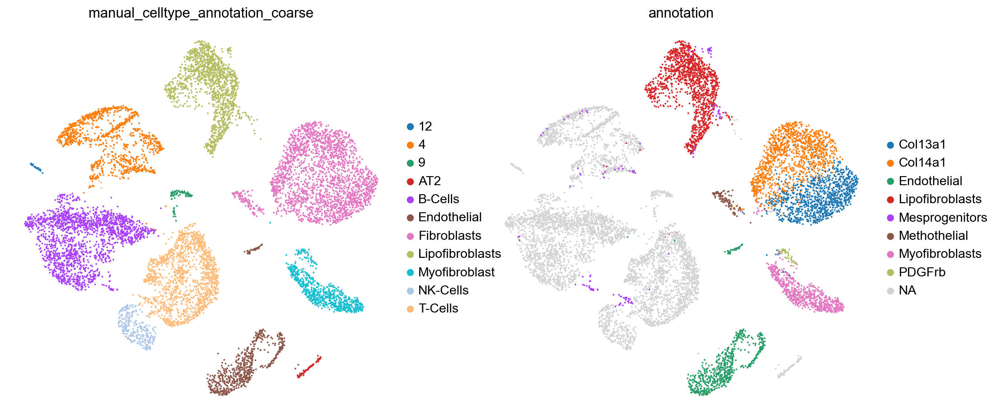

In [82]:
sc.pl.umap(xie, color=["manual_celltype_annotation_coarse", "annotation"])

In [85]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## Leiden resolution=0.5 - finer annotation

/mnt/cip/home/p/pohll/mambaforge/envs/scbp_r/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


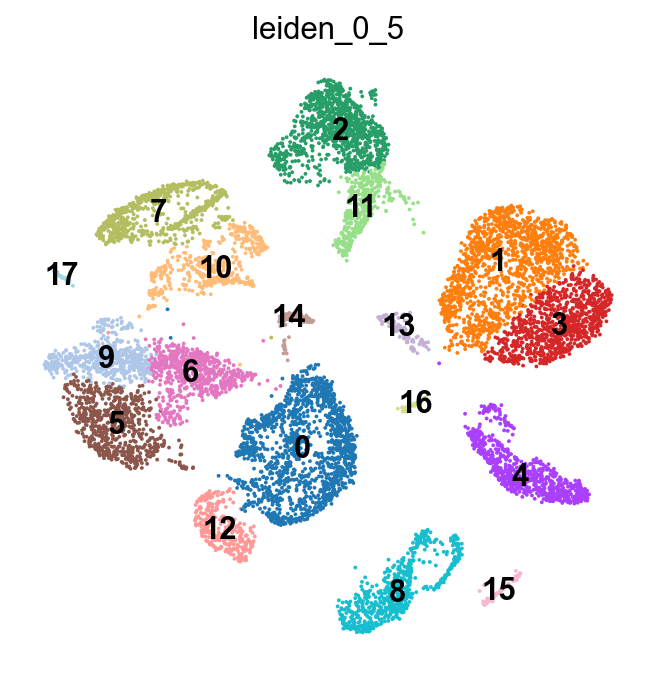

In [106]:
sc.tl.leiden(xie, resolution=0.5, key_added="leiden_0_5")

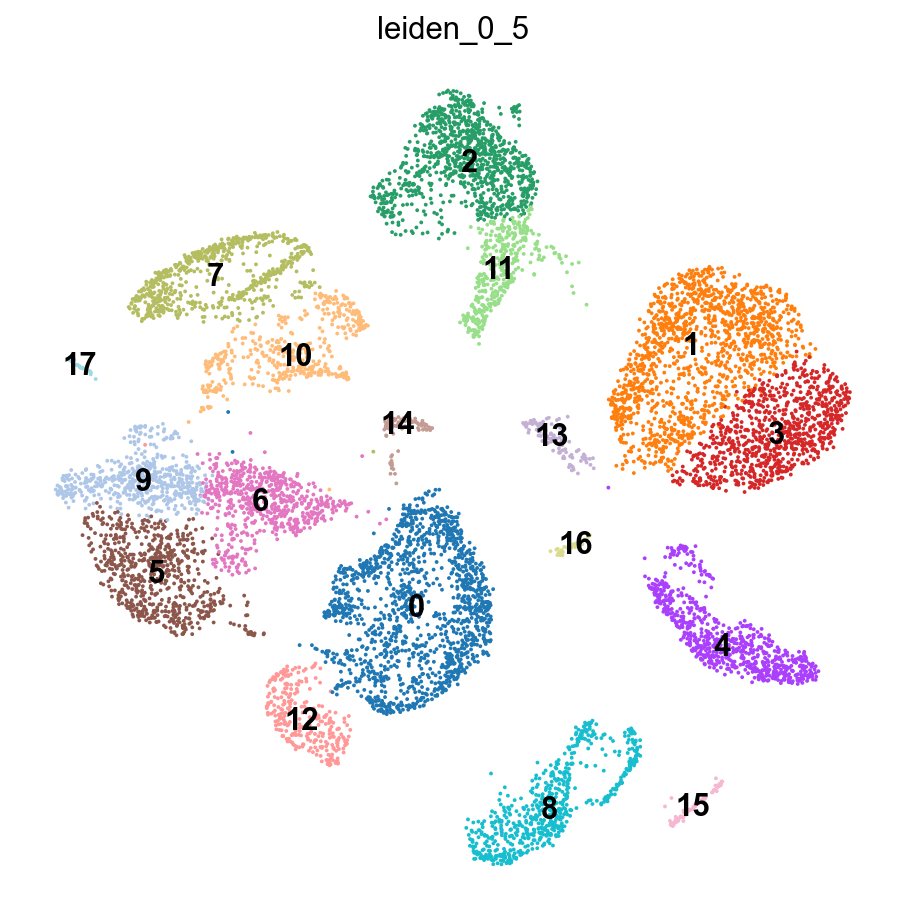

In [83]:
plt.rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(xie, color="leiden_0_5", legend_loc="on data")

Interstitial macrophages


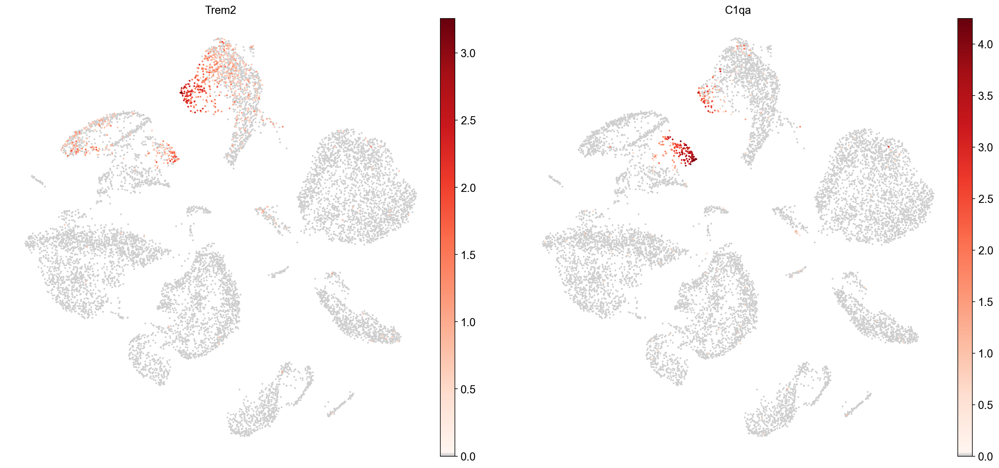

Alveolar macrophages


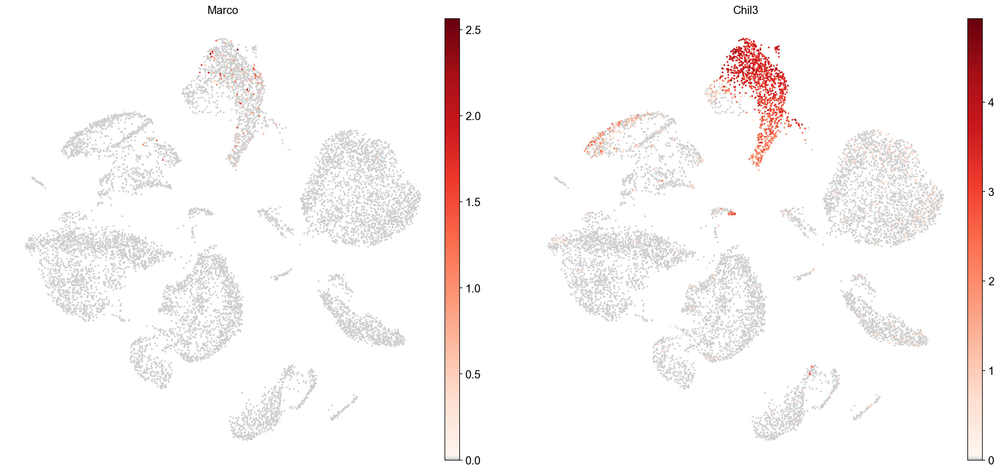

In [96]:
print("Interstitial macrophages")
sc.pl.umap(xie, color=["Trem2","C1qa"], cmap=mymap, size=20)
print("Alveolar macrophages")
sc.pl.umap(xie, color=["Marco","Chil3"], cmap=mymap, size=20)


In [160]:
cl_anno = {
    "0":"T-Cells",
    "1":"Fibroblasts - Col14a1 hi",
    "3": "Fibroblasts - Col13a1 hi",  
    "2": "Lipofibroblasts", # Mpeg1 
    "11": "Lipofibroblasts", # ear1, ear2
    "4": "Myofibroblast", 
    "5": "B-Cells", # cd79a + cd79b + Ly6D + ms4a1--> b cell, 
    "6": "B-Cells", # cd79a + cd79b + ms4a1--> b cell, Ly6D -> b cell, t cell 
    "9": "B-Cells", #egfl7 --> see 5 + 6
    "8": "Endothelial", # EPAS1, egfl7 --> Adipocytes, Endothelial cells,
    "16": "Endothelial", # ccl21a --> t cells, aqp1 --> endothelial
    "12": "NK-Cells", #nkg7 + klrk1 --> NK cells
    "13": "Mesothelial", 
    "15": "AT2",
    "17": "B-Cells", # ???
    "7": "Macrophages?", # alox5ap --> macrophage, nk, t cells, fyb1 + lst1 --> -cells, Interstitial Macrophages? Bcells?
    "10": "Macrophages?", # immunue cells: ly86 -->  B-cells, monocytes, h2-dmb1 --> dendritic cells, mononuclear phagocytes, some endothelial cells, thymic epithelial cells, and B cell, ccr2 --> monocytes, dendritic cells (DCs), endothelial cells, 
    
    "14": "14" #  s100a9 --> monocytes, early differentiation stages of macrophages., lst1 --> macropahges 
}


In [161]:
xie.obs["manual_celltype_annotation"] = xie.obs.leiden_0_5.map(cl_anno).astype("category")

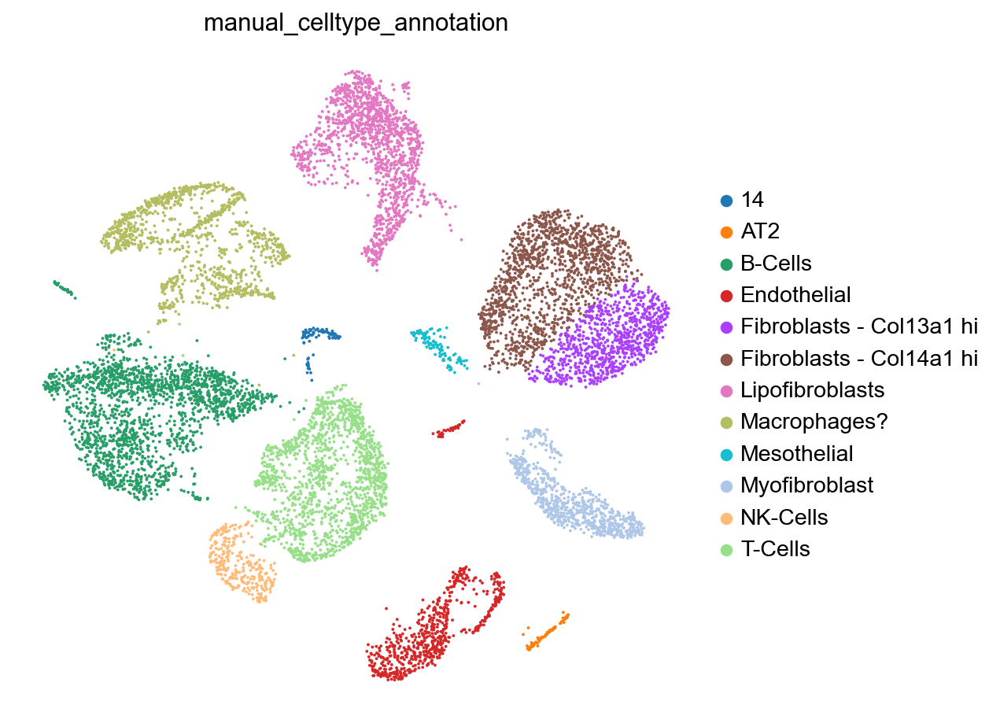

In [162]:
sc.pl.umap(xie, color=["manual_celltype_annotation"])

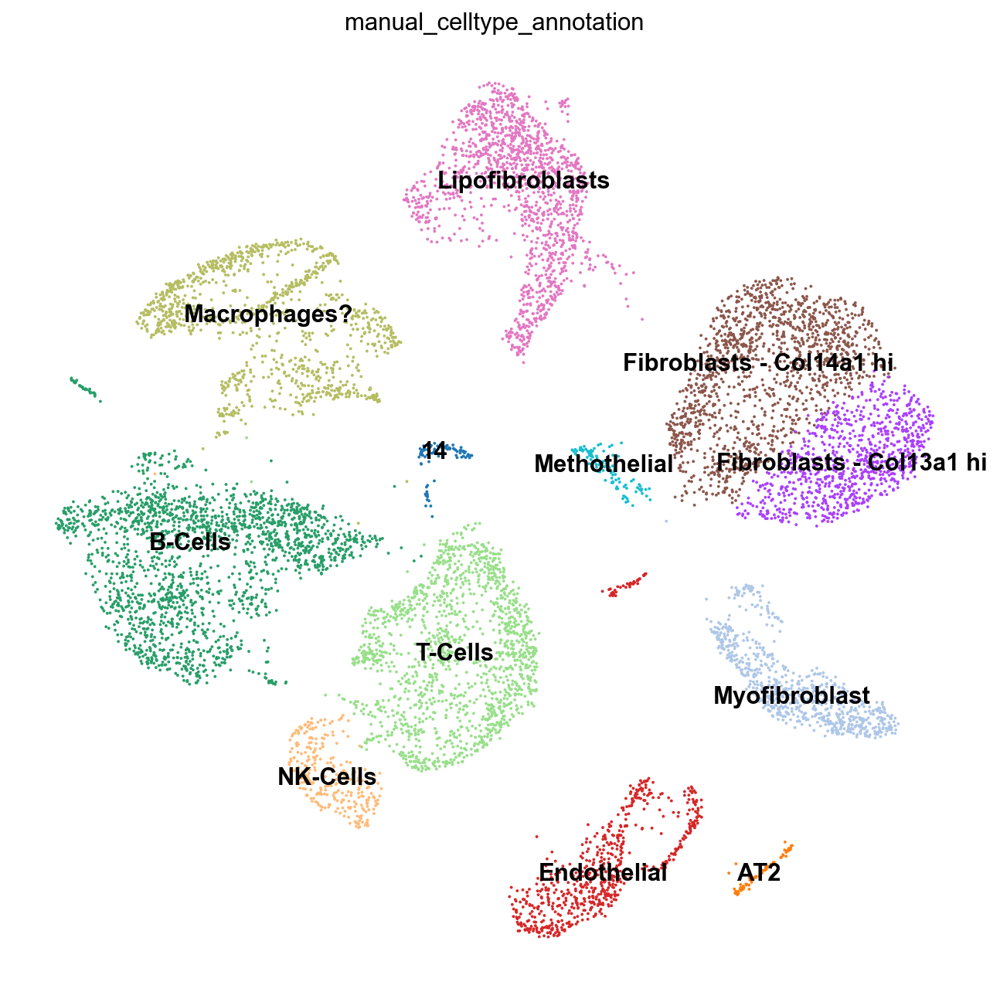

In [93]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(xie, color=["manual_celltype_annotation"], legend_loc = "on data")

In [94]:
xie.write('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

In [ ]:
xie = sc.read('/home/p/pohll/Desktop/MP/data/xie_leonie.h5ad')

## rank_genes_groups

In [113]:
xie.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(
    xie, groupby="leiden_0_5", method="wilcoxon", key_added="dea_leiden_0_5"
)

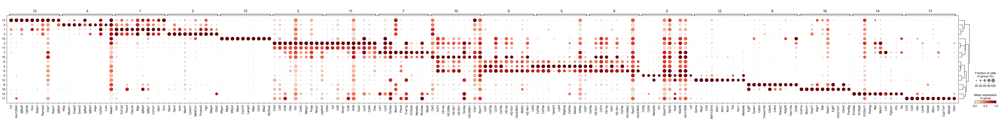

In [114]:
sc.pl.rank_genes_groups_dotplot(
    xie, groupby="leiden_0_5", standard_scale="var", n_genes=10, key="dea_leiden_0_5"
)

In [115]:
#select for more cluster-specific differentially expressed genes:
sc.tl.filter_rank_genes_groups(
    xie,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_5",
    key_added="dea_leiden_0_5_filtered",
)



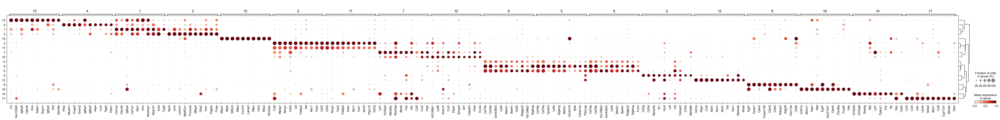

In [116]:
sc.pl.rank_genes_groups_dotplot(
    xie,
    groupby="leiden_res0_5",
    standard_scale="var",
    n_genes=10,
    key="dea_leiden_0_5_filtered",
)


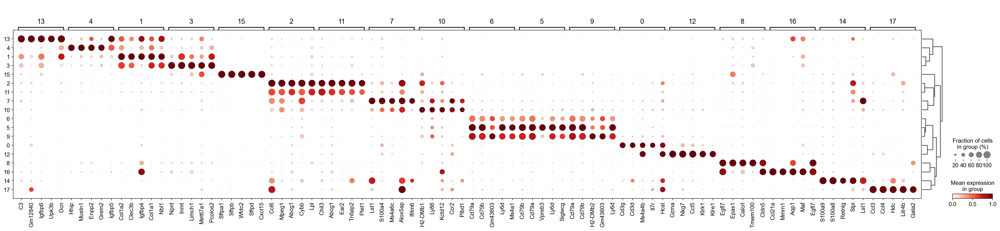

In [136]:
sc.pl.rank_genes_groups_dotplot(
    xie,
    groupby="leiden_res0_5",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_5_filtered",
)


## comparison of rank_genes_groups and marker genes

### extract the fist 10 DE genes per cluster 

In [117]:

rank_genes_group_df = sc.get.rank_genes_groups_df( xie,
    #groupby="leiden_res0_5",
    #standard_scale="var",
    #n_genes=10,
    group=None,
    key="dea_leiden_0_5_filtered")

In [118]:
rank_genes_group_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Cd3g,45.090961,6.098556,0.000000e+00,0.000000e+00
1,0,Cd3d,41.892838,5.691260,0.000000e+00,0.000000e+00
2,0,Ms4a4b,40.076576,4.489505,0.000000e+00,0.000000e+00
3,0,Il7r,37.288815,4.802187,2.491447e-304,1.395111e-300
4,0,NaN,36.526772,1.540406,4.169093e-292,1.945438e-288
...,...,...,...,...,...,...
503959,17,NaN,-6.808414,-1.392942,9.868102e-12,1.062643e-08
503960,17,NaN,-6.857749,-1.991420,6.995435e-12,8.515574e-09
503961,17,NaN,-6.996903,-2.276676,2.616823e-12,3.488848e-09
503962,17,NaN,-7.575378,-2.450274,3.580817e-14,6.683714e-11


In [126]:
cluster_rankgenes_dict = {}

for group, values in rank_genes_group_df.groupby('group')['names']:
    names = values.dropna().values[:10].tolist()
    group_dict[group] = names

### dot plot marker genes and genes resulting from rank_genes_groups, compare and find out striking genes 

In [132]:
#for celltype in marker_genes.keys():
#    print(celltype)
#    sc.pl.dotplot(xie, marker_genes[celltype], groupby='leiden_0_5')
    

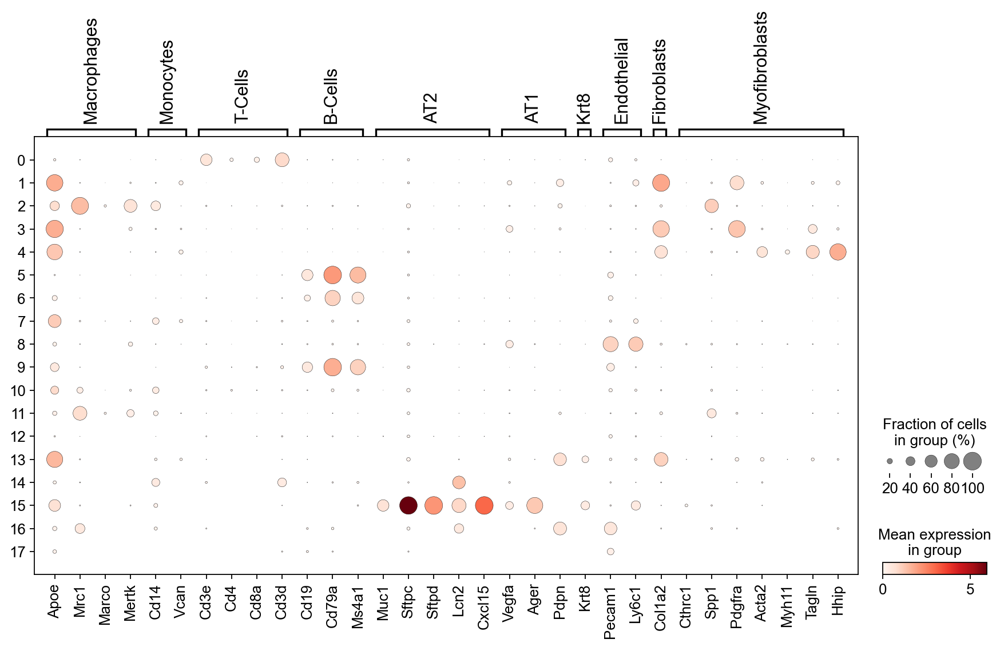

In [131]:
sc.pl.dotplot(xie, marker_genes, groupby='leiden_0_5')

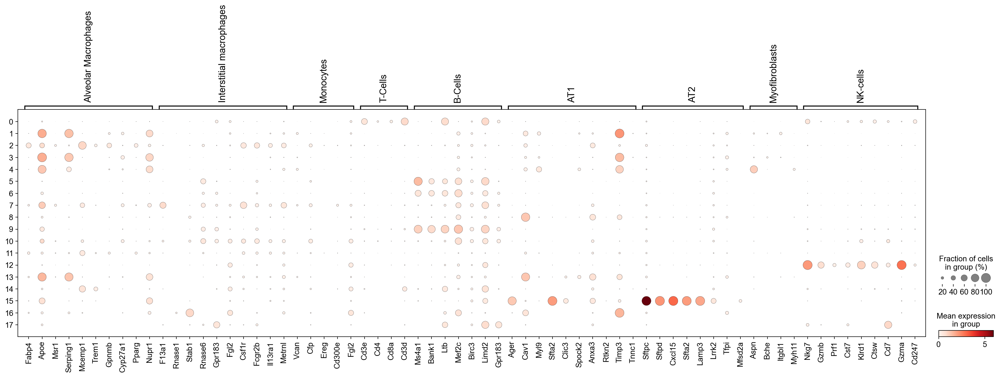

In [134]:
sc.pl.dotplot(xie, marker_genes_hcla, groupby='leiden_0_5')

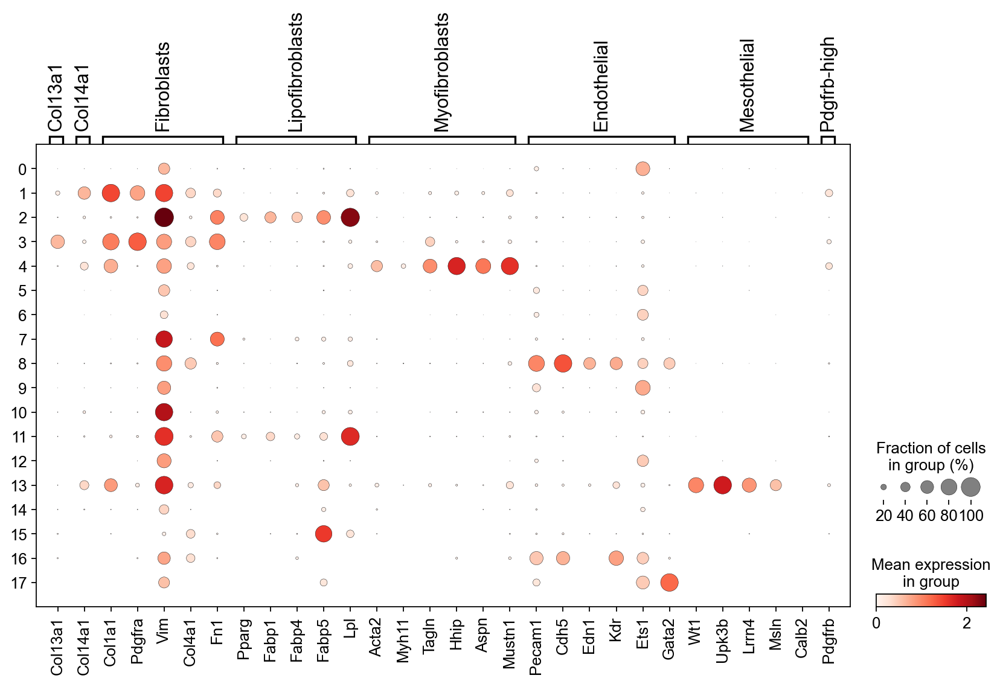

In [135]:
sc.pl.dotplot(xie, marker_genes_xie, groupby='leiden_0_5')

## Analyze Myeloid cell clusters

In [175]:
Myeloid_gene_marker = {
    "Alveolar macrophages": ["Marco", "Chil3", "Siglecf", "Fcgr1", "Itgax", "Il18"],# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3824047/#:~:text=Siglec%20F%2C%20which%20is%20typically,macrophages%20in%20the%20mouse%20lung.
    "Interstitial macrophages": ["Trem2", "C1qa", "Itgam","Fcgr1" ], # CD11b+ MHC II+ CD11c+ CD64+, # FCGR1A = Cd64, ITGAX = Cd11c, ITGAM = Cd11b
    "Dendritic" : ["Clec9a", "H2-Aa"], 
    "Mast cells": ["Tpsab1", "Tpsb2", "Cpa3", "Hpgds", "Ms4a2", "Gata2", "Kit", "Clu", "Vwa5a", "Rgs13"], 
    "Classical monocytes" : ["F13a1", "Ly6c2"], 
    "non-classical monocytes" : ["Treml4"]
}

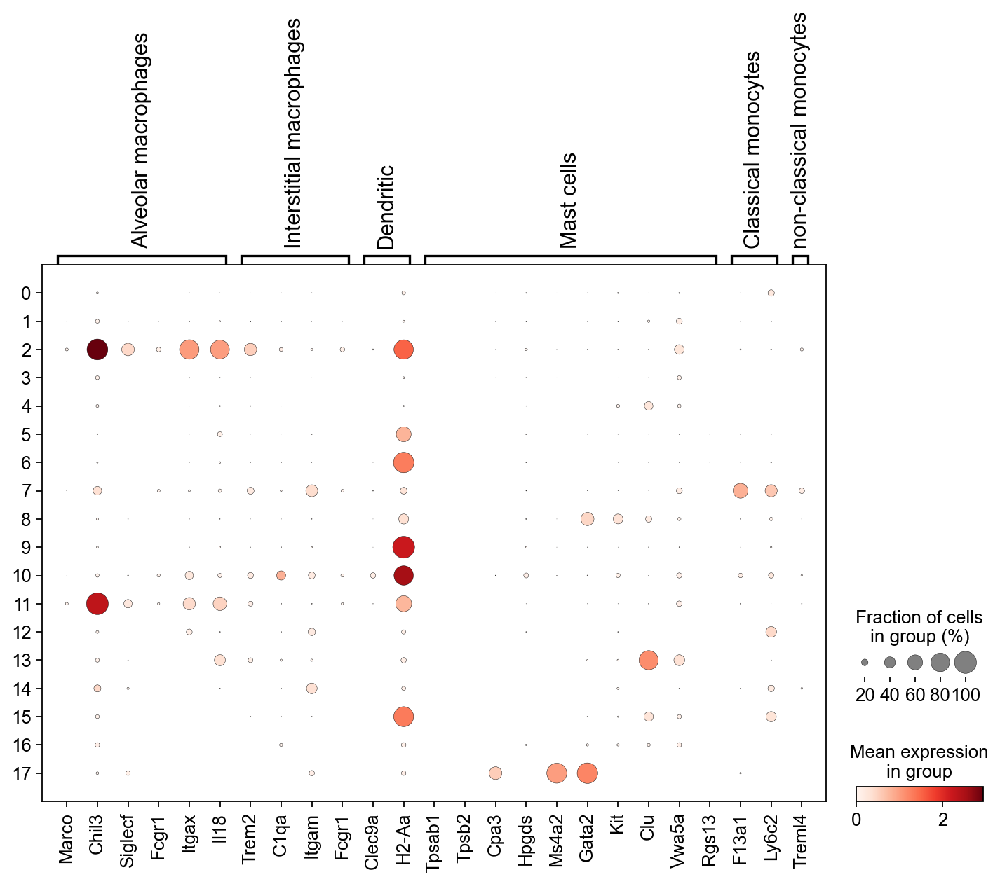

In [176]:
sc.pl.dotplot(xie, Myeloid_gene_marker, groupby='leiden_0_5', )

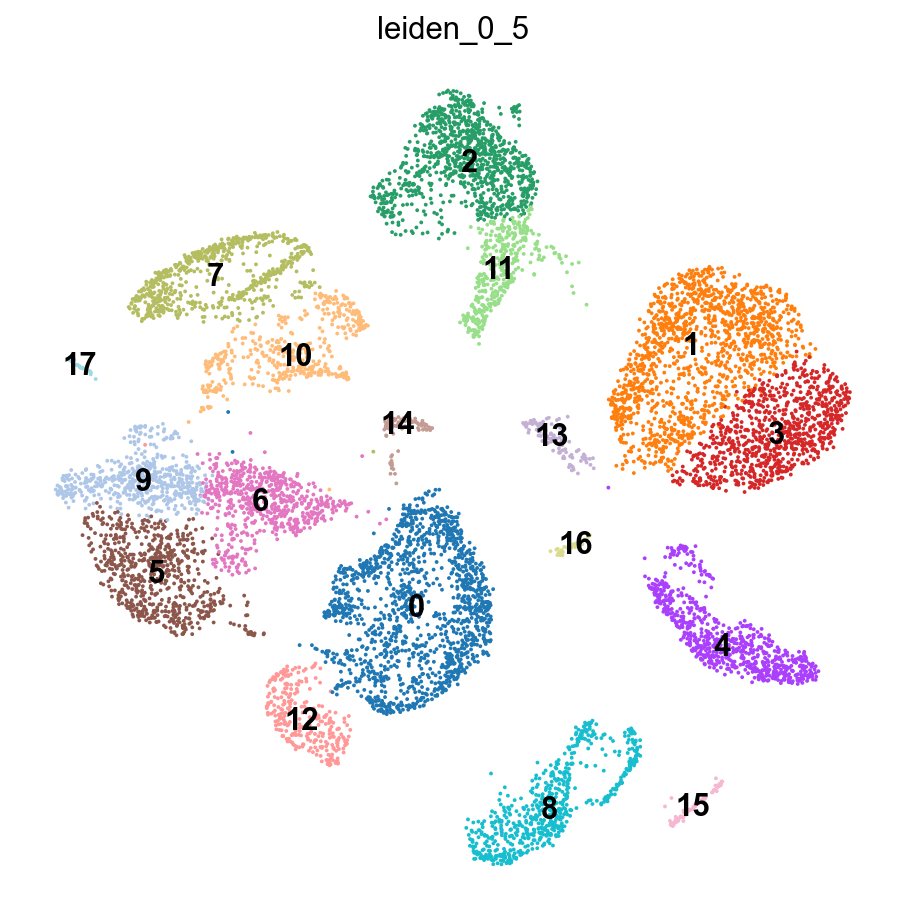

In [173]:
sc.pl.umap(xie, color="leiden_0_5", legend_loc="on data")

In [ ]:
for cell_type in Myeloid_gene_marker.keys():
    print(cell_type)
    sc.pl.umap(xie, color=Myeloid_gene_marker[cell_type], cmap=mymap, size=20)

- 11 also Alveolar macrophages?
- Interstitial macrophages subcluster of 10?
- 17 Mast cells?
- 7 and 14: both S100 and Lst1

In [185]:
cl_anno = {
    "0":"T-Cells",
    "1":"Fibroblasts - Col14a1 hi",
    "3": "Fibroblasts - Col13a1 hi",  
    "2": "Lipofibroblasts", # Mpeg1 
    "11": "Lipofibroblasts", # ear1, ear2
    "4": "Myofibroblast", 
    "5": "B-Cells", # cd79a + cd79b + Ly6D + ms4a1--> b cell, 
    "6": "B-Cells", # cd79a + cd79b + ms4a1--> b cell, Ly6D -> b cell, t cell 
    "9": "B-Cells", #egfl7 --> see 5 + 6
    "8": "Endothelial", # EPAS1, egfl7 --> Adipocytes, Endothelial cells,
    "16": "Endothelial", # ccl21a --> t cells, aqp1 --> endothelial
    "12": "NK-Cells", #nkg7 + klrk1 --> NK cells
    "13": "Mesothelial", 
    "15": "AT2",
    "17": "Mast Cells?", # 
    "7": "Macrophages?", # alox5ap --> macrophage, nk, t cells, fyb1 + lst1 --> -cells, Interstitial Macrophages? Bcells?
    "10": "Dendtritic?", # immunue cells: ly86 -->  B-cells, monocytes, h2-dmb1 --> dendritic cells, mononuclear phagocytes, some endothelial cells, thymic epithelial cells, and B cell, ccr2 --> monocytes, dendritic cells (DCs), endothelial cells, 
    
    "14": "Myeloid" #  s100a9 --> monocytes, early differentiation stages of macrophages., lst1 --> macropahges 
}

In [184]:
print(group_dict["7"])
print(group_dict["14"])


['Lst1', 'S100a4', 'Ms4a6c', 'Alox5ap', 'Ifitm6', 'Fyb', 'Gsr', 'Ccl9', 'Ccr2', 'Pld4']
['S100a9', 'S100a8', 'Retnlg', 'Slpi', 'Lst1', 'Pglyrp1', 'Il1b', 'Hp', 'Hdc', 'Csf3r']


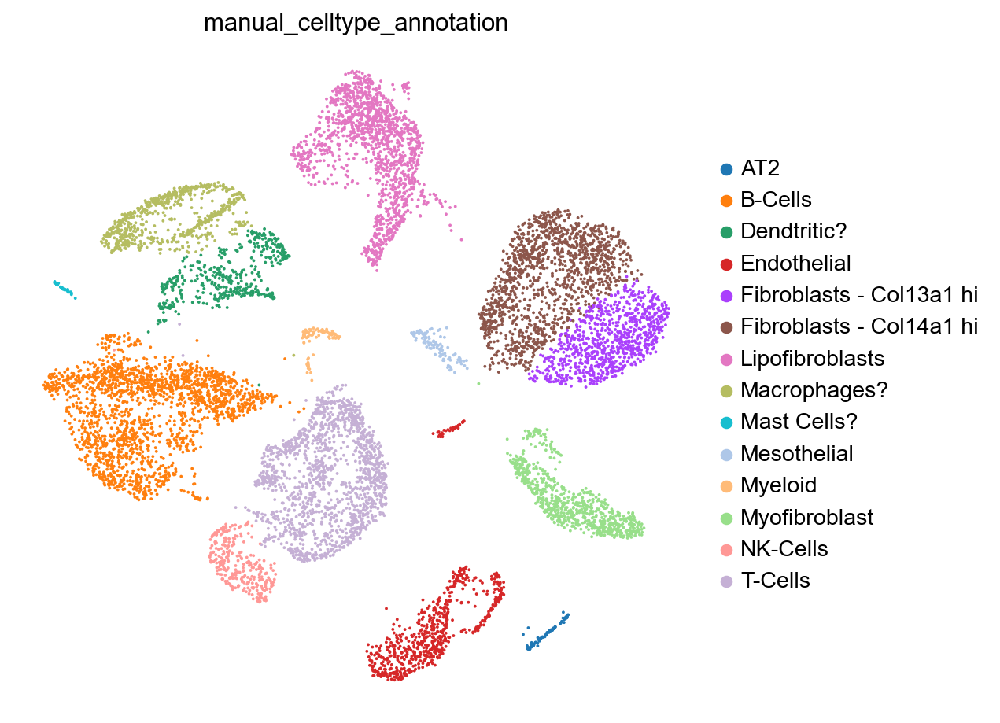

In [186]:
xie.obs["manual_celltype_annotation"] = xie.obs.leiden_0_5.map(cl_anno).astype("category")
sc.pl.umap(xie, color=["manual_celltype_annotation"])

In [188]:
xie.obs["mt_outlier"] = xie.obs["mt_outlier"].astype("category")

## final annotation

In [215]:
all_marker_genes = {
  "AT1": ["S100a6", "Ager", "Pdpn", "Vegfa"],
  "AT2": ["Muc1", "Sftpc", "Sftpd", "Cxcl15", "Lcn2"],
  "Transitioning epithelial": ["Krt8", "Krt18"],
  "Epithelial": ["Epcam", "Cdh1"],
  "Alveolar macrophages": ["Marco", "Chil3", "Fabp4", "Siglecf", "Il18", "Ear1", "Fabp1", "Car4", "Ctsk", "Chil3", "S100a1", "Wfdc21", "Itgam", "Cd36", "Gpnmb", "Litaf", "Jund", "Bhlhe40", "Bhlhe41", "Klf9", "Atf3", "Atf4"],
  "Interstitial macrophages": ["Trem2", "C1qa"],
  "Classical monocytes": ["F13a1", "Ly6c2"],
  "Non-classical monocytes": ["Treml4", "Fcgr3"],
  "Dendritic cells": ["Clec9a", "H2-Aa"],
  "Dendritic cells pDC": ["Siglech", "Clec4b1"],#  Clec4b1 instead of Clec4c
  "Dendritic cells Ccr7-hi": ["Ccr7"],
  "CD4 T-cells": ["Cd4", "Cd3e", "Cd3d"],
  "CD8 T-cells": ["Cd8a", "Cd3d"],
  "NK cells": ["Tyrobp", "Gzma", "Nkg7"],
  "B-cells": ["Cd79a", "Cd19", "Ms4a1"],
  "Neutrophils": ["S100a8", "S100a9"],
  "Endothelial": ["Pecam1", "Ly6c1"], # Pecam1 instead of Pecam4
  "Lymphatic endothelial": ["Pdpn"],
  "Aerocytes": ["Car4", "Ednrb"],
  "Pericytes": ["Vtn", "Mcam", "Cspg4"],
  "Lipofibroblasts": ["Plin2", "Lpl", "Tcf21"],
  "Myofibroblasts": ["Cthrc1", "Spp1", "Pdgfra", "Col3a1", "Postn", "Tnc", "S100a6", "Ccl2"],
  "Alveolar fibroblast": ["Npnt", "Ces1d", "Slc7a10"],
  "Adventitial fibroblast": ["Pi16", "Dcn", "Il33", "Ccl11", "Adh7"],
  "Peribronchial fibroblasts": ["Hhip", "Aspn", "Fgf18", "Lgr5", "Lgr6"],
  "SMCs": ["Acta2", "Tagln", "Myh11"]
}

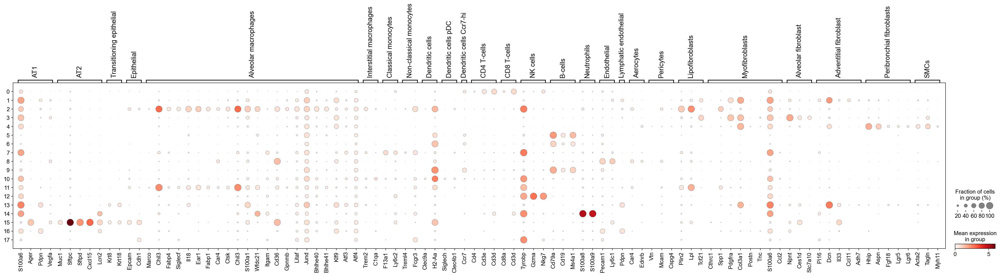

In [216]:
sc.pl.dotplot(xie, all_marker_genes, groupby='leiden_0_5',  standard_scale="var")

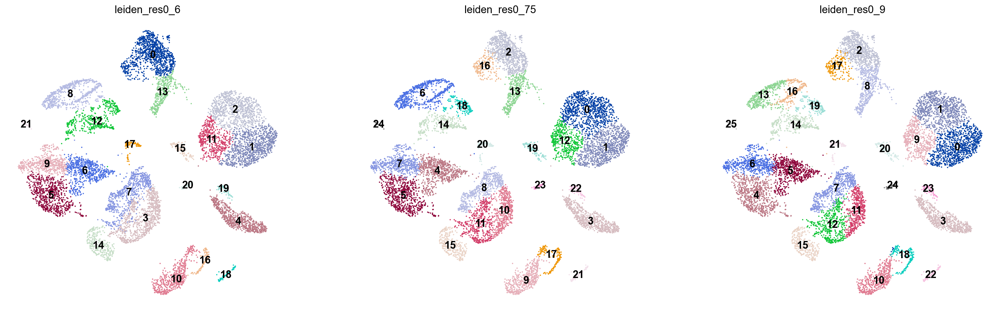

In [218]:
sc.tl.leiden(xie, key_added="leiden_res0_6", resolution=0.6)
sc.tl.leiden(xie, key_added="leiden_res0_75", resolution=0.75)
sc.tl.leiden(xie, key_added="leiden_res0_9", resolution=0.9)
sc.pl.umap(
    xie,
    color=["leiden_res0_6","leiden_res0_75", "leiden_res0_9"],
    legend_loc="on data",
)

In [220]:
sc.tl.leiden(xie, resolution=0.75, key_added="leiden_0_75")

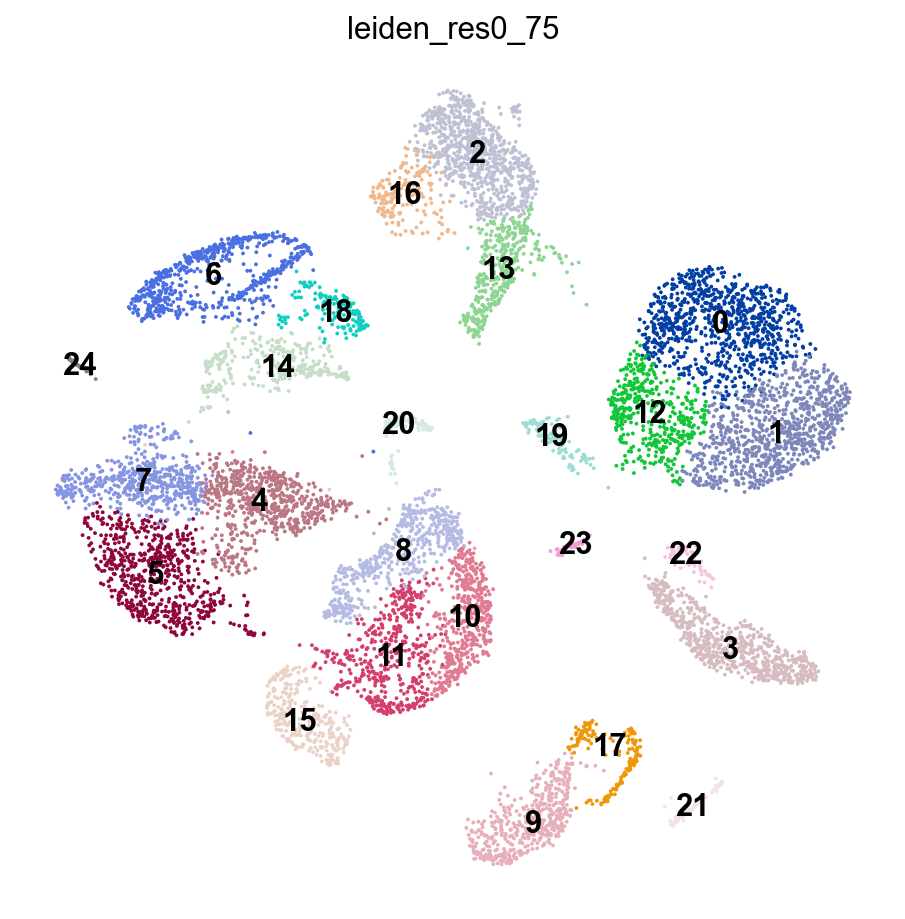

In [224]:
sc.pl.umap(
    xie,
    color="leiden_res0_75",
    legend_loc="on data",
)

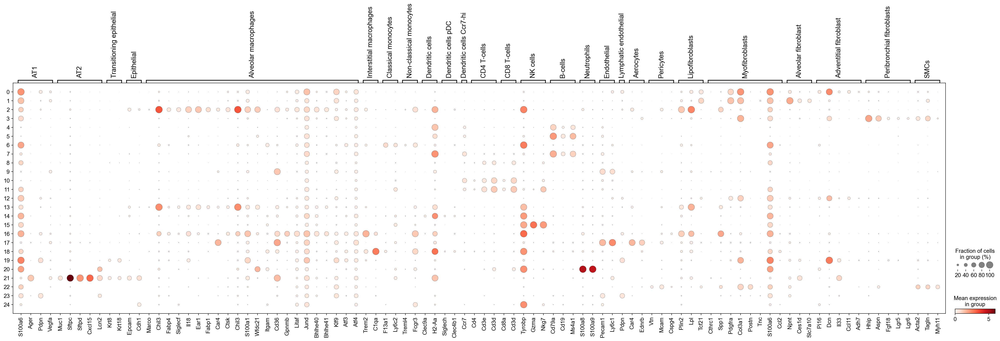

In [221]:
sc.pl.dotplot(xie, all_marker_genes, groupby='leiden_0_75', standard_scale="var")

In [231]:
final_anno = {
    "0": "Myofibroblasts",
    "1": "Myofibroblasts",
    "2": "Alveolar macrophages",
    "3": "Peribronchial fibroblasts",
    "4": "B-cells",
    "5": "B-cells",
    "6": "Classical monocytes",
    "7": "Dendritic cells Ccr7-hi", # many doublets or B-cells 
    "8": "T-cells",
    "9": "Endothelial",
    "10": "T-cells",
    "11": "T-cells",
    "12": "Myofibroblasts",
    "13": "Alveolar macrophages",
    "14": "Dendritic cells",
    "15": "NK cells",
    "16": "Interstitial macrophages", #? or Lipofibroblast
    "17": "Aerocytes",
    "18": "Interstitial macrophages",
    "19": "AT1",
    "20": "Neutrophils",
    "21": "AT2",
    "22": "SMCs",
    "23": "AT1",
    "24": "NK cells" # ? 
}
# dedritic and be cell mixing 

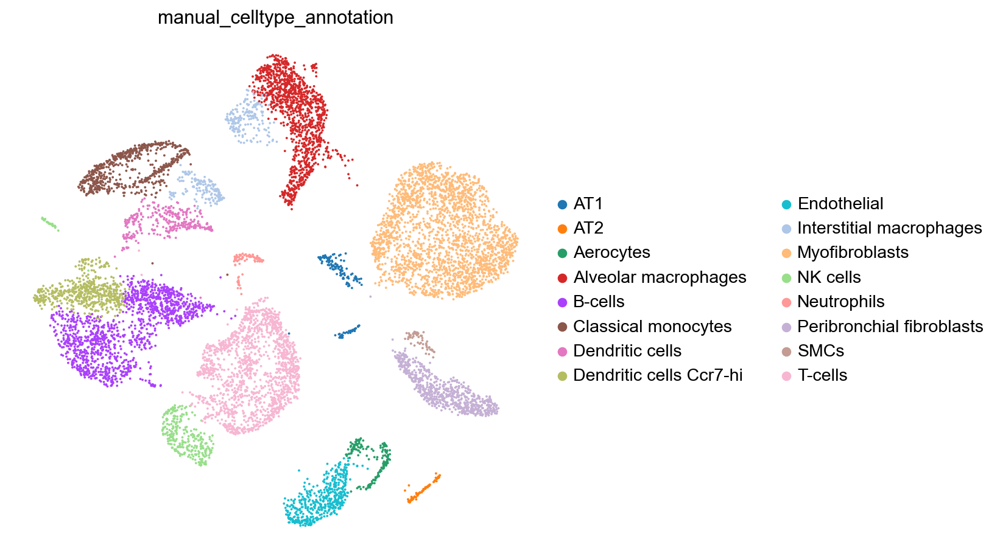

In [234]:
xie.obs["manual_celltype_annotation"] = xie.obs.leiden_0_75.map(final_anno).astype("category")
sc.pl.umap(xie, color=["manual_celltype_annotation"])

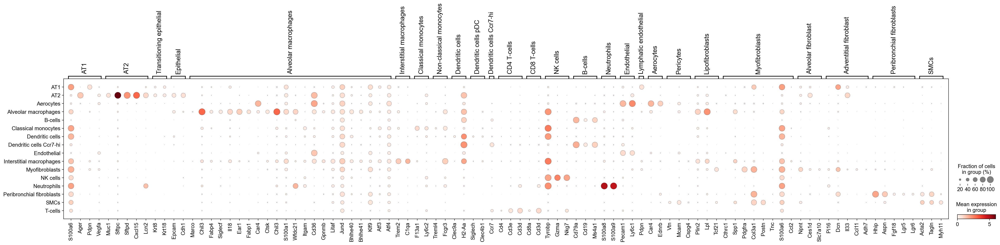

In [233]:
sc.pl.dotplot(xie, all_marker_genes, "manual_celltype_annotation_0_75",  standard_scale="var") # todo mit var, + in Präsi

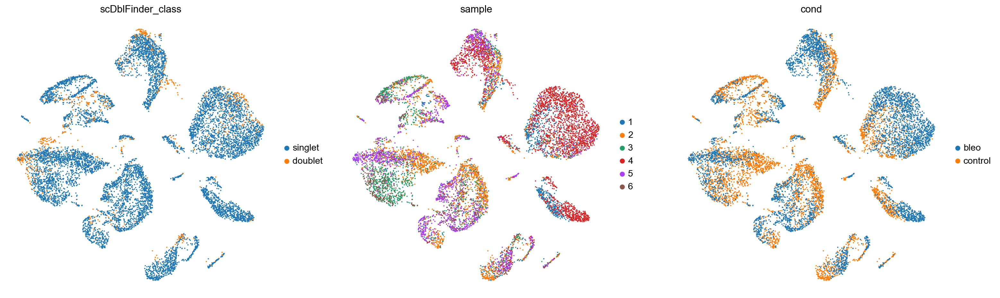

In [228]:
sc.pl.umap(
    xie,
    color=["scDblFinder_class", "sample", "cond"],
    #legend_loc="on data",
)

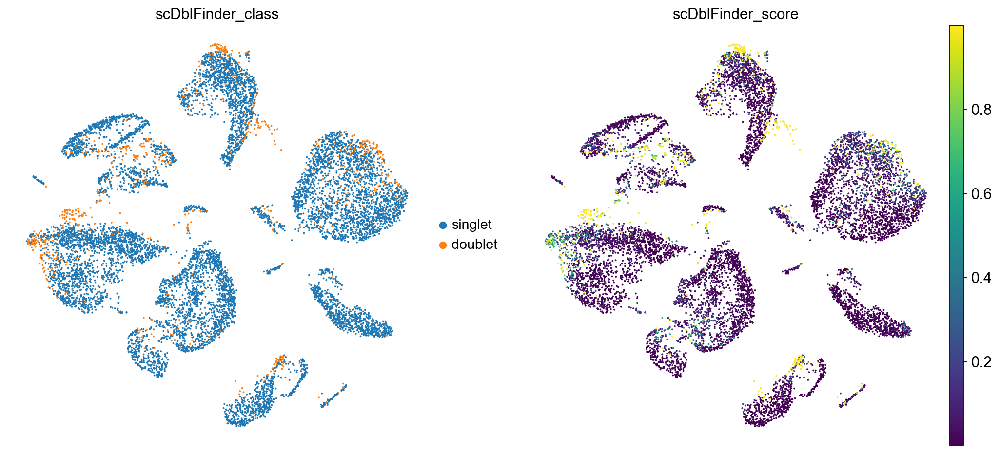

In [230]:
sc.pl.umap(
    xie,
    color=["scDblFinder_class", "scDblFinder_score"],
    #legend_loc="on data",
)

## Prepare anndata for merge 

In [264]:
xie

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'sample', 'n_genes', 'n_counts', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'leiden_res0_1', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'cond', 'leiden_0_5', 'manual_celltype_annotation', 'leiden_0_1', 'leiden_0_25', 'manual_celltype_annotation_coarse', 'leiden_res0_6', 'leiden_res0_75', 'leiden_res0_9', 'leiden_0_75', 'manual_celltype_annotation_0_75'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'annotation_colo

which information should anndatas contain: 
- adata.X --> raw counts
in adata.obs 
- "batch" --> number or name idetifying batch/sample
- "author_annotation" --> annotation given by paper
- "manual_celltype_annotation" --> your annotation
- "condition" --> "healthy" or "bleo" or other treatment for fibrosis 
- 'scDblFinder_score'
- 'scDblFinder_class'

In [247]:
xie_raw = sc.read("/home/p/pohll/Desktop/MP/data/xie_X_raw_counts_leonie.h5ad")


In [248]:
merge_xie = ad.AnnData(X=xie_raw.X, obs=xie.obs[['annotation', 'scDblFinder_score', 'scDblFinder_class',
                                                 "manual_celltype_annotation", "sample", "cond"]],
                       var=pd.DataFrame(xie.var.index).set_index('symbol'))

In [256]:
merge_xie.obs = merge_xie.obs.rename(columns={'annotation': 'author_annotation', 'sample': 'batch', 'cond': 'condition'})

In [260]:
merge_xie

AnnData object with n_obs × n_vars = 10100 × 27998
    obs: 'author_annotation', 'scDblFinder_score', 'scDblFinder_class', 'manual_celltype_annotation', 'batch', 'condition'

In [257]:
merge_xie.obs

,author_annotation,scDblFinder_score,scDblFinder_class,manual_celltype_annotation,batch,condition
AAACCTGAGGACATTA-1,Col13a1,0.021293,singlet,Myofibroblasts,1,control
AAACCTGCAGTCGTGC-1,Myofibroblasts,0.000934,singlet,Peribronchial fibroblasts,1,control
AAACCTGCATGAAGTA-1,Lipofibroblasts,0.000118,singlet,Alveolar macrophages,1,control
AAACCTGTCTCGCATC-1,Myofibroblasts,0.000478,singlet,Peribronchial fibroblasts,1,control
AAACGGGTCCTAGAAC-1,Myofibroblasts,0.000669,singlet,Peribronchial fibroblasts,1,control
...,...,...,...,...,...,...
TTTACTGTCTGGCGAC-6,NaN,0.102398,singlet,B-cells,6,bleo
TTTGCGCCAATGAAAC-6,NaN,0.000643,singlet,T-cells,6,bleo
TTTGGTTCAGTAGAGC-6,NaN,0.000652,singlet,B-cells,6,bleo
TTTGTCAAGCTACCGC-6,NaN,0.000205,singlet,B-cells,6,bleo


In [259]:
merge_xie.write("/home/p/pohll/Desktop/MP/data/xie_for_merge.h5ad")

## Daniel's annotation

In [64]:
# daniel's xie adata:
xie_processed = sc.read('/home/p/pohll/Desktop/MP/data/xie/processed.h5ad') 
# use (backed="r") if h5ad very big 

In [117]:
xie_processed.obs.louvain_final.value_counts()

louvain_final
lipofibroblasts                1689
b-cells 1                      1195
t-cells 1                      1131
b-cells2                        751
Am,0                            712
Hpp1 fibroblasts,0              679
monocytes                       679
endothelial                     658
Peribronchiolar fibroblasts     621
Am,1                            560
9                               436
11                              287
Mo-Am                           179
AT2                             132
dendridic cells                 121
interstitial macrophages        114
Adh7+ fibroblasts               102
neutrophils,2                    95
neutrophils,3                    90
14                               44
fibroblasts                      38
myofibroblasts                   24
Name: count, dtype: int64

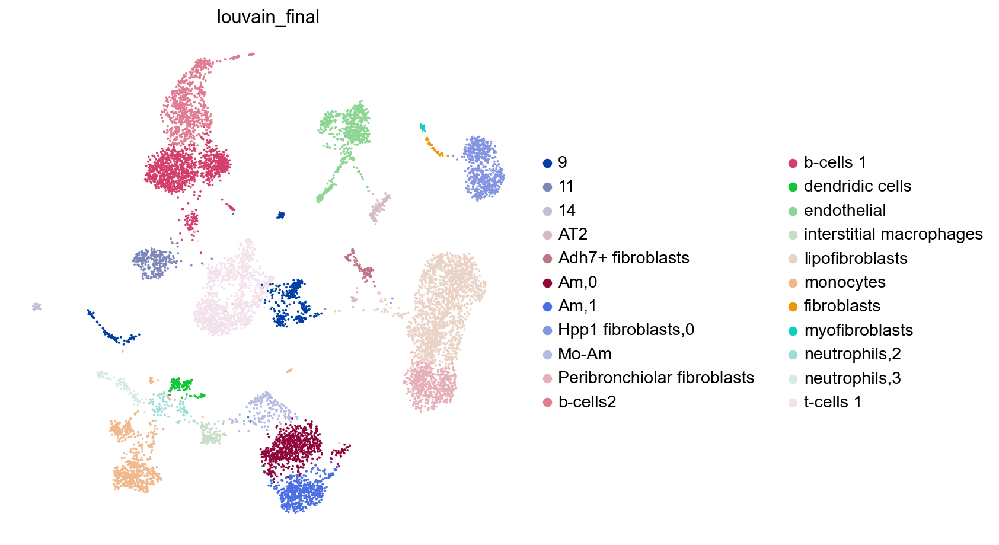

In [65]:
plt.rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(xie_processed, color=["louvain_final"])